In [1]:
import os
os.environ['DJANGO_SETTINGS_MODULE'] = 'ClusterCast.settings'
import test_utils
import django
django.setup()
import sys
sys.path.append("/home/ajp031/StockDeepLearning/ClusterCast/ClusterCast")
from asgiref.sync import sync_to_async
from importlib import reload
import ClusterPipeline.models.ClusterProcessing as cp
import ClusterPipeline.models.SequencePreprocessing as sp
import ClusterPipeline.models.TSeriesPreproccesing as tsp
from copy import deepcopy
import numpy as np
from tensorflow.keras.backend import clear_session
import random
from tensorflow.keras.optimizers import Adam
import paper_utils
import tensorflow as tf

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f7d2e23fd00>
Traceback (most recent call last):
  File "/usr/remote/apps/anaconda/2023.03-acet116/lib/python3.10/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/usr/remote/apps/anaconda/2023.03-acet116/lib/python3.10/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/usr/remote/apps/anaconda/2023.03-acet116/lib/python3.10/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/usr/remote/apps/anaconda/2023.03-acet116/lib/python3.10/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
2024-05-05 20:47:26.333023: I tensorflow/core/pl

In [2]:
tickers = ['aapl', 'msft','f', 'spy', 'xom']
start_date = '2007-01-01'
end_date = '2024-01-01'
steps = 75
cluster_features = ['close', 'ema200']
target_features = ['pctChgclose+{}_target'.format(i) for i in range(1, 26) ]
interval = '1d'

In [15]:
training_features = ['pctChgclose', 'pctChgVix', 'pctChgvolume', 'hiLo','opCl', 'pctChgClHi', 'pctChgClOp',
                     "pctDiff+ema50_close", 'deriv+ema50','pctDiff+smaVol5_volume', 'macd_diff','stoch_d', 'pctDiff+ema200_close',
                     "pctDiff+bb_high_low20", 'pctDiff+bb_high_close20', 'pctDiff+bb_low_close20',
                     'pctDiff+ema10_close', 'pctDiff+ema20_close', 'pctDiff+ema100_close',
                     'deriv+ema10', 'deriv+ema20','deriv+ema100', 'rsi20']

In [7]:
scaling_dict = {
    "price_vars": sp.ScalingMethod.UNSCALED,
    "trend_vars": sp.ScalingMethod.UNSCALED,
    "pctChg_vars": sp.ScalingMethod.STANDARD,
    "rolling_vars": sp.ScalingMethod.STANDARD,
    "target_vars": sp.ScalingMethod.QUANT_MINMAX,
    "lag_feature_vars": sp.ScalingMethod.STANDARD,
    "momentum_vars": sp.ScalingMethod.STANDARD,
}

In [8]:
group_params = cp.StockClusterGroupParams(
    tickers=tickers,
    start_date=start_date,
    end_date=end_date,
    n_steps=steps,
    cluster_features=cluster_features,
    target_cols=target_features,
    interval=interval,
    training_features=training_features,
)
group_params.set_scaling_dict(scaling_dict)
group_params.initialize() 

In [9]:
data_sets = []
for ticker in tickers:
    data_set = tsp.StockDataSet(group_params, ticker)
    data_set.preprocess_pipeline(to_train = True)
    data_sets.append(data_set)

group_params = data_sets[0].group_params

group_params.data_sets = data_sets    

Creating and Processing Dataset
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Empty DataFrame
Columns: []
Index: [2007-01-03 00:00:00]
Momentum Features Created
Scaling Standard
Scaling Quant Min Max Features
Quant Min Max Features Scaled
RandomForest Compete
Dataset Preprocessing Complete
Creating and Processing Dataset
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Empty DataFrame
Columns: []
Index: [2007-01-03 00:00:00]
Momentum Features Created
Scaling Standard
Scaling Quant Min Max Features
Quant Min Max Features Scaled
RandomForest Compete
Dataset Preprocessing Complete
Creating and Processing Dataset
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
Empty DataFrame
Columns: []
Index: [2007-01-03 00:00:00]
Momentu

In [10]:
sequence_set = sp.StockSequenceSet(group_params)
sequence_set.preprocess_pipeline(add_cuma_pctChg_features = False)

Creating Sequences
Scaling Sequences
Scaling Sequences Complete
Sequence Preprocessing Complete


In [11]:
training_seq_elements = group_params.train_seq_elements
test_seq_elements = group_params.test_seq_elements


In [12]:
X_train, y_train = sp.SequenceElement.create_array(training_seq_elements)
X_test, y_test = sp.SequenceElement.create_array(test_seq_elements)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(16740, 75, 517) (16740, 80)
(3865, 75, 517) (3865, 80)


In [13]:
X_feature_dict = group_params.X_feature_dict
y_feature_dict = group_params.y_feature_dict

In [16]:
X_train_filtered = paper_utils.filter_by_features(X_train,training_features, X_feature_dict)
X_test_filtered = paper_utils.filter_by_features(X_test,training_features, X_feature_dict)
y_train_filtered = paper_utils.filter_y_by_features(y_train,target_features, y_feature_dict)
y_test_filtered = paper_utils.filter_y_by_features(y_test,target_features, y_feature_dict)

In [17]:
reload(paper_utils)

<module 'paper_utils' from '/home/ajp031/ClusterCastProd/Notebooks/paper_utils.py'>

In [18]:
# y_train_filtered, y_test_filtered = paper_utils.append_end_token(y_train_filtered, y_test_filtered)
# print(y_train_filtered.shape, y_test_filtered.shape)

In [19]:
# iterations = 3
# X_sampled_train, y_sampled_train = paper_utils.augment_and_sample(X_train_filtered, y_train_filtered, y_test_filtered.shape[1], iterations, X_train_filtered.shape[0] // 4)
# X_sampled_test, y_sampled_test = paper_utils.augment_and_sample(X_test_filtered, y_test_filtered, y_test_filtered.shape[1], iterations, X_test_filtered.shape[0] // 4)

In [20]:
# print(X_sampled_train.shape, y_sampled_train.shape)
# print(X_sampled_test.shape, y_sampled_test.shape)

In [21]:
y_train_filtered = np.expand_dims(y_train_filtered, axis=-1)
y_test_filtered = np.expand_dims(y_test_filtered, axis=-1)

In [22]:
print(X_train_filtered.shape, y_train_filtered.shape)
print(X_test_filtered.shape, y_test_filtered.shape)

(16740, 75, 23) (16740, 25, 1)
(3865, 75, 23) (3865, 25, 1)


In [23]:
total_cluster = paper_utils.Cluster(-1, X_train_filtered, y_train_filtered, X_test_filtered, y_test_filtered, training_seq_elements, test_seq_elements)

In [24]:
import test_utils_models
reload(test_utils_models)

<module 'test_utils_models' from '/home/ajp031/ClusterCastProd/Notebooks/test_utils_models.py'>

In [25]:
baseline_model = test_utils_models.CustomSeq2SeqModelStop(len(target_features), X_train_filtered.shape[1], X_train_filtered.shape[2])

2024-05-05 20:54:14.601818: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-05 20:54:14.763115: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-05-05 20:54:14.763424: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [26]:
# baseline_model.build((None,X_train_filtered.shape[1], X_train_filtered.shape[2]))
# baseline_model.load_weights('model_weights.h5')

In [27]:
lr = 0.0001
batch_size = 32
epochs = 150
# loss = sdtw.SDTWLoss(gamma = 1.0)
loss = test_utils_models.custom_loss_updated

baseline_model.compile(optimizer = Adam(learning_rate=lr), loss = loss)

In [28]:
total_cluster.train_model(baseline_model, epochs, batch_size, shuffle = True, patience = 100)

(16740, 75, 23) (16740, 25, 1)
Epoch 1/150
(None, 75, 64)


2024-05-05 20:54:20.554888: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-05 20:54:20.557299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-05 20:54:20.558935: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

decoder outputs
(None, 25, 1)
Decision Tensor("custom_loss_updated/strided_slice_1:0", shape=(None, 25, 1), dtype=float32)
Y_TRUE_CUM Tensor("custom_loss_updated/Cumsum:0", shape=(None, 25, 1), dtype=float32)
Y_PRED_CUM Tensor("custom_loss_updated/Cumsum_1:0", shape=(None, 25, 1), dtype=float32)
cumulative profit loss  Tensor("custom_loss_updated/SelectV2_3:0", shape=(None, 25, 1), dtype=float32)
PROFIT_LOSS Tensor("custom_loss_updated/mul:0", shape=(None, 25, 1), dtype=float32)
REGULATED_LOSS Tensor("custom_loss_updated/add_1:0", shape=(None, 25, 1), dtype=float32)
ABSTAIN_PENALTY Tensor("custom_loss_updated/mul_3:0", shape=(None, 25, 1), dtype=float32)
(None, 75, 64)


2024-05-05 20:54:27.944734: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-05 20:54:27.946949: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-05 20:54:27.948523: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

decoder outputs
(None, 25, 1)
Decision Tensor("custom_loss_updated/strided_slice_1:0", shape=(None, 25, 1), dtype=float32)
Y_TRUE_CUM Tensor("custom_loss_updated/Cumsum:0", shape=(None, 25, 1), dtype=float32)
Y_PRED_CUM Tensor("custom_loss_updated/Cumsum_1:0", shape=(None, 25, 1), dtype=float32)
cumulative profit loss  Tensor("custom_loss_updated/SelectV2_3:0", shape=(None, 25, 1), dtype=float32)
PROFIT_LOSS Tensor("custom_loss_updated/mul:0", shape=(None, 25, 1), dtype=float32)
REGULATED_LOSS Tensor("custom_loss_updated/add_1:0", shape=(None, 25, 1), dtype=float32)
ABSTAIN_PENALTY Tensor("custom_loss_updated/mul_3:0", shape=(None, 25, 1), dtype=float32)


2024-05-05 20:54:38.953013: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8904
2024-05-05 20:54:39.280193: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x7f7bf401b8e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-05 20:54:39.280231: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2024-05-05 20:54:39.314157: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-05 20:54:39.564771: I ./tensorflow/compiler/jit/device_compiler.h:180] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


523/524 [============================>.] - ETA: 0s - loss: 0.6142(None, 75, 64)


2024-05-05 20:55:04.579253: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-05 20:55:04.581509: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-05 20:55:04.583056: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

decoder outputs
(None, 25, 1)
Attention Weights Shape:  (None, 25, 75)
Decision Tensor("custom_loss_updated/strided_slice_1:0", shape=(None, 25, 1), dtype=float32)
Y_TRUE_CUM Tensor("custom_loss_updated/Cumsum:0", shape=(None, 25, 1), dtype=float32)
Y_PRED_CUM Tensor("custom_loss_updated/Cumsum_1:0", shape=(None, 25, 1), dtype=float32)
cumulative profit loss  Tensor("custom_loss_updated/SelectV2_3:0", shape=(None, 25, 1), dtype=float32)
PROFIT_LOSS Tensor("custom_loss_updated/mul:0", shape=(None, 25, 1), dtype=float32)
REGULATED_LOSS Tensor("custom_loss_updated/add_1:0", shape=(None, 25, 1), dtype=float32)
ABSTAIN_PENALTY Tensor("custom_loss_updated/mul_3:0", shape=(None, 25, 1), dtype=float32)
524/524 [==============================] - 51s 56ms/step - loss: 0.6142 - val_loss: 0.4705
Epoch 2/150
524/524 [==============================] - 26s 49ms/step - loss: 0.3507 - val_loss: 0.3419
Epoch 3/150
524/524 [==============================] - 26s 49ms/step - loss: 0.2743 - val_loss: 0.3007

KeyboardInterrupt: 

In [29]:
reload(paper_utils)

<module 'paper_utils' from '/home/ajp031/ClusterCastProd/Notebooks/paper_utils.py'>

In [30]:
output, weights = baseline_model.predict(X_test_filtered)

(None, 75, 64)


2024-05-05 21:02:44.996860: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-05 21:02:44.999065: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-05 21:02:45.000488: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

decoder outputs
(None, 25, 1)
Attention Weights Shape:  (None, 25, 75)
121/121 [==============================] - 6s 23ms/step


In [31]:
y_pred = output[:, :, :-1]  # all but the last column
end_decision = output[:, :, -1:]  # last column

In [32]:
output_string, total_results = test_utils.eval_pred(y_pred,y_test_filtered,num_days = 25)

25


In [33]:
print(output_string)

Cluster Number:
Accuracy1D 52.34% PredictedRet: 0.01577729010377091 ActRet: 0.08355280011892319
Accuracy2D 52.45% PredictedRet: 0.03195559897855826 ActRet: 0.15878090262413025
Accuracy3D 52.99% PredictedRet: 0.04760952087627955 ActRet: 0.22771024703979492
Accuracy4D 53.07% PredictedRet: 0.06281598767435556 ActRet: 0.28925782442092896
Accuracy5D 53.2% PredictedRet: 0.07830315127465476 ActRet: 0.3429943025112152
Accuracy6D 52.88% PredictedRet: 0.09385392674546747 ActRet: 0.3895827531814575
Accuracy7D 53.01% PredictedRet: 0.109592255907429 ActRet: 0.43030494451522827
Accuracy8D 54.1% PredictedRet: 0.12490219560260239 ActRet: 0.4666643738746643
Accuracy9D 54.54% PredictedRet: 0.13993169061713376 ActRet: 0.5001574158668518
Accuracy10D 54.18% PredictedRet: 0.15496688341908035 ActRet: 0.5321481227874756
Accuracy11D 54.46% PredictedRet: 0.16973777036650955 ActRet: 0.5638079643249512
Accuracy12D 54.33% PredictedRet: 0.18462786567602235 ActRet: 0.5960928201675415
Accuracy13D 53.89% PredictedRet:

In [34]:
test_utils.visualize_future_distribution(total_results)

(3865, 51)


In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

In [36]:
print(end_decision.shape)

(3865, 25, 1)


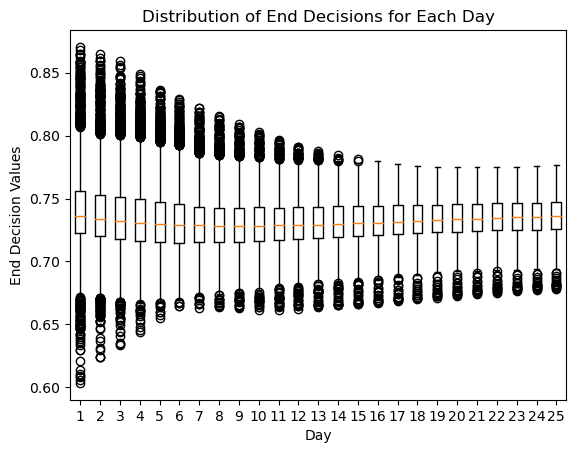

In [37]:
end_decision_reshaped = end_decision.squeeze()

# Create a box plot for each day
plt.boxplot(end_decision_reshaped)

# Add title and labels
plt.title('Distribution of End Decisions for Each Day')
plt.xlabel('Day')
plt.ylabel('End Decision Values')

# Show the plot
plt.show()

In [ ]:
# for i in range(0,20):
#     y_pred = y_pred_cum[i]
#     y_true = y_test_cum[i]
#     end_decision_cur = end_decision[i]

#     # plot 
#     plt.figure(figsize=(10,6))
#     plt.plot(y_pred, label='Prediction')
#     print(y_true.shape)
#     plt.plot(y_true, label='True')
    
#     plt.legend()

#     plt.show()

#     plt.figure(figsize=(10,6))
#     plt.plot(end_decision_cur)

In [38]:
def plot_end_decision(end_decision_cur):
    # Create a box plot for each day
    plt.figure(figsize=(10,6))
    plt.plot(end_decision_cur)
    return plt

In [ ]:
# output_train, weights_train = baseline_model.predict(X_train_filtered)
# decoder_output_train = output_train[:, :, :-1]  # all but the last column
# end_decision_train = output_train[:, :, -1:]  # last column
# y_train_cum = np.cumsum(decoder_output_train, axis=1)
# y_teain_cum = np.cumsum(y_train_filtered, axis=1)

In [ ]:
end_decision_reshaped = end_decision_train.squeeze()

# Create a box plot for each day
plt.boxplot(end_decision_reshaped)

# Add title and labels
plt.title('Distribution of End Decisions for Each Day')
plt.xlabel('Day')
plt.ylabel('End Decision Values')

# Show the plot
plt.show()

In [ ]:
# for i in range(0,20):
#     y_pred = y_pred_cum[i]
#     y_true = y_test_cum[i]
#     end_decision_cur = end_decision[i]

#     # plot 
#     plt.figure(figsize=(10,6))
#     plt.plot(y_pred, label='Prediction')
#     plt.plot(y_true, label='True')
#     plt.legend()

#     plt.show()

#     plt.figure(figsize=(10,6))
#     plt.plot(end_decision_cur)

In [ ]:
y_feature_sets = group_params.y_feature_sets
predicted_y_transformed = np.zeros_like(y_pred)
for i, feature in enumerate(target_features):
    scaler = [feature_set for feature_set in y_feature_sets if feature == feature_set.name][0].scaler
    predicted_y_transformed[:, i] = scaler.inverse_transform(y_pred[:, i].reshape(-1, 1))

In [ ]:
y_pred_cum = np.cumsum(predicted_y_transformed, axis=1)

In [ ]:
baseline_model.save_weights('model_weights.h5')

In [ ]:
for i in range(20,40):
    print('Sequence Element {}'.format(i))
    
    seq_element = test_seq_elements[i]
    attention_weights = weights[i]
    prediction = predicted_y_transformed[i]
    plot_end_decision(end_decision[i])



    print('baseline weights')
    test_utils.plot_attention_weights_single(attention_weights)


    paper_utils.visualize_future_movement_mpl(seq_element, prediction, prediction, scaler, target_features = target_features, num_days = len(target_features))

